In [ ]:
!pip install kaggle

     |████████████████████████████████| 58 kB 398 kB/s 
     |████████████████████████████████| 78 kB 272 kB/s 
  Created wheel for kaggle: filename=kaggle-1.5.12-py3-none-any.whl size=73053 sha256=3861ed161279e82e02de97cfbe9e32302cd5a3e50fb91ccf82a8dfa5f93f2044
  Stored in directory: /root/.cache/pip/wheels/29/da/11/144cc25aebdaeb4931b231e25fd34b394e6a5725cbb2f50106
Successfully built kaggle
You should consider upgrading via the '/databricks/python3/bin/python -m pip install --upgrade pip' command.


In [ ]:
%sh
mkdir /root/.kaggle

In [ ]:
%sh
echo "{\"username\":\"saran\", \"key\":\"0b82666877dae3f74d4a58f894a9dc4c\"}" > /root/.kaggle/kaggle.json

In [ ]:
%sh
ls /root/.kaggle
cat /root/.kaggle/kaggle.json

kaggle.json
{"username":"shikhapatel", "key":"0b82666877dae3f74d4a58f894a9dc4c"}


In [ ]:
%sh
mkdir -p /dbfs/tmp

In [ ]:
%sh
chmod 600 /root/.kaggle/kaggle.json

In [ ]:
%sh
cd /dbfs/tmp
kaggle datasets download -d shikhapatel/predictive-maintenance


  0%|          | 0.00/143M [00:00<?, ?B/s]
  9%|▉         | 13.0M/143M [00:00<00:01, 133MB/s]
 22%|██▏       | 31.0M/143M [00:00<00:00, 163MB/s]
 33%|███▎      | 47.0M/143M [00:00<00:00, 129MB/s]
 42%|████▏     | 60.0M/143M [00:00<00:00, 90.5MB/s]
 57%|█████▋    | 81.0M/143M [00:00<00:00, 122MB/s] 
 73%|███████▎  | 104M/143M [00:00<00:00, 150MB/s] 
 85%|████████▌ | 122M/143M [00:00<00:00, 160MB/s]
 99%|█████████▊| 141M/143M [00:01<00:00, 169MB/s]
100%|██████████| 143M/143M [00:01<00:00, 146MB/s]



In [ ]:
%sh
ls /dbfs/tmp

predictive-maintenance.zip


In [ ]:
%sh
cd /dbfs/tmp
unzip predictive-maintenance.zip

Archive:  predictive-maintenance.zip
  inflating: Final_dataframes/df_r1b_t5.csv  
  inflating: Final_dataframes/df_r2b_t5.csv  
  inflating: Final_dataframes/df_r3b_t5.csv  
  inflating: Final_dataframes/df_r4b_t5.csv  
  inflating: Final_dataframes/df_rs_t5.csv  


In [ ]:
file_dir = "/data"
file_dir_path1 = f"{file_dir}/Final_dataframes/df_r1b_t5.csv"
dbutils.fs.cp("file:/dbfs/tmp/Final_dataframes/df_r1b_t5.csv", file_dir_path1)

Out[11]: True

In [ ]:
file_dir = "/data"
file_dir_path2 = f"{file_dir}/Final_dataframes/df_r2b_t5.csv"
dbutils.fs.cp("file:/dbfs/tmp/Final_dataframes/df_r2b_t5.csv", file_dir_path2)

Out[12]: True

In [ ]:
file_dir = "/data"
file_dir_path3 = f"{file_dir}/Final_dataframes/df_r3b_t5.csv"
dbutils.fs.cp("file:/dbfs/tmp/Final_dataframes/df_r3b_t5.csv", file_dir_path3)

Out[13]: True

In [ ]:
file_dir = "/data"
file_dir_path4 = f"{file_dir}/Final_dataframes/df_r4b_t5.csv"
dbutils.fs.cp("file:/dbfs/tmp/Final_dataframes/df_r4b_t5.csv", file_dir_path4)

Out[14]: True

In [ ]:
file_dir = "/data"
file_dir_path5 = f"{file_dir}/Final_dataframes/df_rs_t5.csv"
dbutils.fs.cp("file:/dbfs/tmp/Final_dataframes/df_rs_t5.csv", file_dir_path5)

Out[15]: True

In [ ]:
df_r1b_t5 = spark.read.csv(file_dir_path1, header=True)
df_r2b_t5 = spark.read.csv(file_dir_path2, header=True)
df_r3b_t5 = spark.read.csv(file_dir_path3, header=True)
df_r4b_t5 = spark.read.csv(file_dir_path4, header=True)
df_rs_t5 = spark.read.csv(file_dir_path5, header=True)


In [ ]:
display(df_r1b_t5)

Ia,Ib,Ic,Va,Vb,Vc,Trig,Vib_acpe,Vib_carc,Vib_acpi,Vib_axial,Vib_base
0.0,0.004166667,-0.004166667,-1.183333,-1.175,-1.166667,6.200867,-0.03051758,0.1617432,0.3814697,-0.01220703,0.2655029
0.0,0.0,0.0,-1.225,-1.233333,-1.216667,6.201782,-0.009155273,0.1525879,0.4180908,-0.01220703,0.2227783
0.008333333,-0.004166667,0.0,-1.25,-1.283333,-1.258333,6.202698,0.009155273,0.1464844,0.4486084,-0.0213623,0.1617432
0.01666667,0.0,0.004166667,-1.3,-1.3,-1.283333,6.203308,0.0213623,0.1373291,0.4852295,-0.01525879,0.1068115
0.008333333,-0.008333333,0.0,-1.341667,-1.325,-1.333333,6.202393,0.03356934,0.1312256,0.5065918,-0.01831055,0.07324219
0.004166667,-0.008333333,0.0,-1.341667,-1.325,-1.341667,6.204224,0.04882813,0.1373291,0.5187988,-0.01831055,0.06408691
-0.004166667,0.0,0.01666667,-1.325,-1.35,-1.341667,6.204224,0.06408691,0.1312256,0.5279541,-0.0213623,0.08239746
0.0,-0.004166667,0.008333333,-1.35,-1.325,-1.358333,6.203918,0.07019043,0.1251221,0.5249023,-0.01831055,0.1190186
0.0,-0.004166667,0.004166667,-1.341667,-1.325,-1.333333,6.204834,0.0793457,0.1220703,0.5218506,-0.01831055,0.1495361
0.004166667,0.0,0.0,-1.341667,-1.366667,-1.375,6.204529,0.09155273,0.1190186,0.5126953,-0.02746582,0.1464844


In [ ]:
display(df_r2b_t5)

Ia,Ib,Ic,Va,Vb,Vc,Trig,Vib_acpe,Vib_carc,Vib_acpi,Vib_axial,Vib_base
0.008333333,0.004166667,0.004166667,-0.775,-0.775,-0.7916667,6.193542,0.1647949,0.1281738,0.07629395,0.02441406,0.09460449
0.008333333,0.0,0.008333333,-0.8,-0.8,-0.8166667,6.193237,0.1678467,0.09765625,0.06713867,0.01831055,0.1281738
0.004166667,-0.0125,0.02083333,-0.8,-0.7916667,-0.7916667,6.193237,0.1617432,0.07019043,0.06408691,0.006103516,0.1617432
-0.008333333,0.008333333,0.0125,-0.8333333,-0.85,-0.85,6.192932,0.1373291,0.04272461,0.05493164,0.003051758,0.201416
0.008333333,0.0,0.0,-0.8416667,-0.8666667,-0.8416667,6.192017,0.1281738,0.02441406,0.04272461,0.01220703,0.2258301
0.008333333,0.008333333,0.008333333,-0.875,-0.8833333,-0.8916667,6.192627,0.1342773,0.01525879,0.02441406,0.01220703,0.2471924
0.0,-0.008333333,0.0,-0.9166667,-0.9166667,-0.9166667,6.192932,0.1251221,0.01220703,0.02441406,0.01220703,0.2593994
0.0125,0.004166667,0.0,-0.9333333,-0.95,-0.9416667,6.192017,0.1037598,0.01525879,0.03967285,0.009155273,0.2716064
0.008333333,0.0,0.004166667,-0.95,-0.95,-0.9666667,6.192627,0.09155273,0.01831055,0.04882813,0.01525879,0.3112793
0.0,-0.004166667,-0.008333333,-0.975,-0.975,-1.0,6.192322,0.07629395,0.02746582,0.06713867,0.01525879,0.3295898


In [ ]:
display(df_r3b_t5)

Ia,Ib,Ic,Va,Vb,Vc,Trig,Vib_acpe,Vib_carc,Vib_acpi,Vib_axial,Vib_base
0.008333333,-0.008333333,0.0,2.341667,2.35,2.341667,6.238708,0.01831055,0.289917,-0.08850098,-0.009155273,0.08239746
0.008333333,0.004166667,0.0,2.35,2.333333,2.35,6.240234,0.0,0.3082275,-0.03967285,-0.003051758,0.06408691
-0.008333333,0.0,0.0,2.341667,2.35,2.35,6.238708,-0.003051758,0.3356934,0.01220703,0.0,0.03356934
-0.008333333,-0.004166667,0.008333333,2.35,2.358333,2.341667,6.239624,-0.003051758,0.3570557,0.06713867,0.003051758,0.01525879
-0.004166667,-0.008333333,0.004166667,2.366667,2.383333,2.383333,6.239929,-0.003051758,0.3692627,0.1342773,0.0,-0.003051758
0.0,-0.004166667,0.004166667,2.383333,2.366667,2.4,6.239014,0.0,0.3936768,0.1800537,-0.003051758,-0.01525879
0.0,-0.004166667,0.01666667,2.391667,2.408333,2.4,6.238708,0.003051758,0.402832,0.2105713,-0.01220703,-0.01525879
0.0125,0.0,-0.004166667,2.391667,2.408333,2.416667,6.238708,0.003051758,0.402832,0.2441406,-0.006103516,-0.003051758
-0.004166667,0.004166667,0.0,2.4,2.425,2.416667,6.238403,-0.009155273,0.4119873,0.2624512,-0.003051758,0.01831055
0.0,0.0,0.004166667,2.425,2.416667,2.416667,6.239624,0.006103516,0.4241943,0.27771,0.0,0.01831055


In [ ]:
display(df_r4b_t5)

Ia,Ib,Ic,Va,Vb,Vc,Trig,Vib_acpe,Vib_carc,Vib_acpi,Vib_axial,Vib_base
0.0125,0.004166667,0.004166667,2.975,2.966667,2.958333,6.239319,-0.06408691,0.3295898,0.213623,-0.04272461,0.1098633
-0.01666667,0.0,-0.004166667,2.958333,2.966667,2.966667,6.238403,-0.06103516,0.3082275,0.1983643,-0.05187988,0.1586914
0.008333333,0.004166667,-0.004166667,2.941667,2.925,2.933333,6.238098,-0.04882813,0.2929688,0.1983643,-0.05493164,0.2166748
0.008333333,0.0,-0.004166667,2.916667,2.925,2.916667,6.238098,-0.03356934,0.2838135,0.2044678,-0.03967285,0.2807617
-0.008333333,0.0125,0.0,2.908333,2.9,2.891667,6.238098,-0.03967285,0.2838135,0.2105713,-0.03967285,0.3112793
-0.004166667,0.004166667,-0.004166667,2.858333,2.866667,2.875,6.238098,-0.03356934,0.2685547,0.2227783,-0.03967285,0.3295898
0.004166667,-0.004166667,-0.004166667,2.825,2.825,2.833333,6.237793,-0.03967285,0.2502441,0.2319336,-0.04272461,0.3509521
-0.004166667,0.004166667,0.0,2.766667,2.766667,2.8,6.237183,-0.02746582,0.2380371,0.2532959,-0.03967285,0.3570557
-0.008333333,0.0125,0.01666667,2.758333,2.758333,2.75,6.237488,-0.0213623,0.2227783,0.2716064,-0.03967285,0.3631592
0.0,0.008333333,-0.004166667,2.691667,2.7,2.691667,6.236877,-0.01525879,0.213623,0.2929688,-0.03662109,0.3723145


In [ ]:
display(df_rs_t5)

Ia,Ib,Ic,Va,Vb,Vc,Trig,Vib_acpe,Vib_carc,Vib_acpi,Vib_axial,Vib_base
0.01666667,-0.004166667,0.0125,3.341667,3.341667,3.333333,6.219788,-0.0213623,-0.003051758,-0.07019043,0.01831055,0.2624512
0.008333333,0.0,0.0125,3.35,3.35,3.358333,6.219482,-0.0213623,0.01525879,-0.04577637,0.01525879,0.1922607
0.0,0.0,0.008333333,3.3,3.316667,3.266667,6.219177,-0.0213623,0.02746582,-0.0213623,0.01220703,0.1098633
-0.008333333,0.004166667,0.0,3.4,3.358333,3.4,6.219788,-0.03051758,0.03967285,0.0,0.01220703,0.01220703
0.004166667,-0.008333333,0.004166667,3.275,3.25,3.258333,6.219177,-0.03967285,0.05493164,0.01525879,0.006103516,-0.100708
-0.004166667,0.004166667,-0.004166667,3.408333,3.433333,3.416667,6.217957,-0.06103516,0.06103516,0.0213623,0.003051758,-0.2105713
0.0,0.0125,0.0125,3.275,3.25,3.266667,6.218872,-0.07019043,0.05493164,0.02746582,0.009155273,-0.3204346
-0.008333333,0.004166667,0.0,3.375,3.408333,3.408333,6.217957,-0.07629395,0.08239746,0.02746582,0.01525879,-0.4180908
0.0125,0.0,0.004166667,3.316667,3.333333,3.333333,6.217651,-0.07629395,0.07019043,0.0213623,0.006103516,-0.50354
0.004166667,0.008333333,0.0,3.383333,3.383333,3.35,6.218567,-0.07324219,0.07019043,0.01220703,0.01831055,-0.5523682


In [ ]:
display(df_rs_t5.summary())
display(df_r1b_t5.summary())
display(df_r2b_t5.summary())
display(df_r3b_t5.summary())
display(df_r4b_t5.summary())

summary,Ia,Ib,Ic,Va,Vb,Vc,Trig,Vib_acpe,Vib_carc,Vib_acpi,Vib_axial,Vib_base
count,1000000,1000000,1000000,1000000,1000000,1000000,1000000,1000000,1000000,1000000,1000000,1000000
mean,0.003960741674852647,0.002541162620906317,0.0016714375184386585,-0.0034958982282400444,-0.0012149589616431934,-0.0027966658183480567,0.9895476671856636,0.19682312730855994,0.0822926989030561,0.1865493002787083,0.003365225428111328,0.21458838758196136
stddev,0.0065295509149665915,0.006344438086075457,0.006087199038848961,2.3277325555075508,2.3284723117850565,2.3298866205857895,2.208027842819419,4.1781622419837685,5.044113621670755,6.3285844623932075,0.2817512826187634,4.7554853281243945
min,-0.004166667,-0.004166667,-0.004166667,-0.008333333,-0.008333333,-0.008333333,-0.0003051758,-0.003051758,-0.003051758,-0.003051758,-0.003051758,-0.003051758
25%,0.0,0.0,-0.004166667,-1.958333,-1.958333,-1.958333,0.04547119,-2.056885,-3.433228,-4.266357,-0.1800537,-1.580811
50%,0.004166667,0.004166667,0.0,0.01666667,0.025,0.025,0.04669189,0.2349854,0.1586914,0.3631592,-0.02441406,-0.27771
75%,0.008333333,0.008333333,0.004166667,1.958333,1.966667,1.966667,0.04882813,2.46582,2.822876,5.249023,0.1953125,1.757813
max,0.03333333,0.02916667,0.02916667,3.541667,3.558333,3.916667,6.244507,9.997559,9.997559,9.997559,2.914429,9.997559


summary,Ia,Ib,Ic,Va,Vb,Vc,Trig,Vib_acpe,Vib_carc,Vib_acpi,Vib_axial,Vib_base
count,1000000,1000000,1000000,1000000,1000000,1000000,1000000,1000000,1000000,1000000,1000000,1000000
mean,0.002492733315094274,0.0016230000837288308,0.004420200167799272,-0.012559209439579987,-0.010022448014908225,-0.012053767754110952,0.9432316649330954,0.20379301589989499,0.08917056352502736,0.19405135328033457,0.008577542362012979,0.2209721522089955
stddev,0.006599484850766106,0.006317406842543003,0.0059581581583092735,2.1913911190848974,2.1891799652749513,2.187654213637858,2.1360036503339748,4.337917852726883,5.294110270754068,9.045031181962791,0.38429775642818875,5.330304892802783
min,-0.004166667,-0.004166667,-0.004166667,-0.008333333,-0.008333333,-0.008333333,-0.0003051758,-0.003051758,-0.003051758,-0.003051758,-0.003051758,-0.003051758
25%,0.0,0.0,0.0,-1.983333,-1.966667,-1.975,0.0579834,-2.420044,-3.500366,-6.436157,-0.3143311,-2.359009
50%,0.0,0.0,0.004166667,-0.008333333,0.0,0.0,0.06103516,-0.04882813,0.05187988,0.1617432,0.003051758,0.1464844
75%,0.008333333,0.004166667,0.008333333,1.966667,1.966667,1.966667,0.09735107,2.999878,3.759766,7.870483,0.2502441,3.231812
max,0.1,0.2833333,0.1291667,3.366667,3.408333,4.816667,6.218872,9.997559,9.997559,9.997559,3.012085,9.997559


summary,Ia,Ib,Ic,Va,Vb,Vc,Trig,Vib_acpe,Vib_carc,Vib_acpi,Vib_axial,Vib_base
count,1000000,1000000,1000000,1000000,1000000,1000000,1000000,1000000,1000000,1000000,1000000,1000000
mean,0.0016357416350256243,4.124458767249935E-4,0.00431546683208708,-0.006403100082385082,-0.011895582038289002,-0.013357275294345055,0.8263045814361484,0.20902599394664473,0.09772287724965176,0.1587804592578499,0.011267407568366536,0.2213424606913836
stddev,0.00663880520438978,0.006297418742134019,0.005959922417458733,2.122663348758145,2.128144343483021,2.1143609340134275,2.028660677463108,6.034767849857681,4.318286619507129,7.093326967233264,0.4167222530137528,5.8530194935433215
min,-0.004166667,-0.004166667,-0.004166667,-0.008333333,-0.008333333,-0.008333333,-0.0003051758,-0.003051758,-0.003051758,-0.003051758,-0.003051758,-0.003051758
25%,-0.004166667,-0.004166667,0.0,-1.941667,-1.95,-1.958333,0.04943848,-2.908325,-1.763916,-4.669189,-0.1556396,-2.792358
50%,0.0,0.0,0.004166667,0.0,0.0,0.0,0.05249023,1.153564,-0.02746582,0.07629395,0.02746582,-0.02746582
75%,0.008333333,0.004166667,0.008333333,1.95,1.941667,1.941667,0.05584717,3.656006,1.40686,3.775024,0.3448486,3.234863
max,0.02916667,0.02916667,0.075,5.058333,4.375,4.458333,6.251831,9.997559,9.997559,9.997559,3.671265,9.997559


summary,Ia,Ib,Ic,Va,Vb,Vc,Trig,Vib_acpe,Vib_carc,Vib_acpi,Vib_axial,Vib_base
count,1000000,1000000,1000000,1000000,1000000,1000000,1000000,1000000,1000000,1000000,1000000,1000000
mean,-8.516956673254687E-4,-0.0010776040729942908,0.007627362440815339,-0.0427601334462115,-0.019843392234071163,0.010839956737647715,0.9112992102589283,0.20449132866312306,0.09639091672408018,0.15919189726564556,0.009230844343878795,0.2207738875979934
stddev,0.8274552150813862,0.8419649315042911,0.8452102120333358,11.796110916052571,11.755155744207716,11.536123874134145,2.1296577587286736,4.559662502425173,5.15207624703086,5.57170943717515,0.22819675319866556,5.648950360747359
min,-0.004166667,-0.004166667,-0.004166667,-0.008333333,-0.008333333,-0.008333333,-0.0003051758,-0.003051758,-0.003051758,-0.003051758,-0.003051758,-0.003051758
25%,-0.004166667,-0.004166667,0.0,-1.983333,-1.983333,-1.983333,0.050354,-3.018188,-2.157593,-1.809692,-0.1068115,-2.352905
50%,0.0,0.0,0.004166667,-0.008333333,0.0,0.0,0.05126953,0.5126953,0.4760742,0.6530762,0.009155273,0.4608154
75%,0.008333333,0.004166667,0.008333333,1.975,1.966667,1.975,0.05279541,3.35083,2.243042,3.567505,0.1403809,2.69165
max,9.995833,9.995833,9.991667,99.875,99.95833,99.94167,6.259766,9.997559,9.997559,9.997559,3.042603,9.997559


summary,Ia,Ib,Ic,Va,Vb,Vc,Trig,Vib_acpe,Vib_carc,Vib_acpi,Vib_axial,Vib_base
count,1000000,1000000,1000000,1000000,1000000,1000000,1000000,1000000,1000000,1000000,1000000,1000000
mean,0.0019220957382405624,0.0060335334032577785,-0.002537279166015877,-0.028810393685412806,0.01620051323026994,-0.019920558334084456,0.8775801291088473,0.200913970809527,0.10116536963009051,0.15756536115003622,0.00837863803499611,0.21710580604115814
stddev,0.551456952829879,0.5399568097254392,0.5587886666265318,6.593969747133172,6.744466849510989,6.448761945333094,2.0842093356264138,8.948527728629829,8.244292615669515,7.75291940038578,0.4028147508251767,8.521365390336388
min,-0.004166667,-0.004166667,-0.004166667,-0.008333333,-0.008333333,-0.008333333,-0.0003051758,-0.003051758,-0.003051758,-0.003051758,-0.003051758,-0.003051758
25%,-0.004166667,0.0,-0.004166667,-2.008333,-2.0,-2.0,0.05767822,-7.437134,-6.063843,-6.713867,-0.3112793,-5.969238
50%,0.0,0.004166667,0.0,-0.008333333,0.0,0.0,0.05950928,0.1678467,0.177002,0.1068115,0.01831055,0.378418
75%,0.008333333,0.008333333,0.004166667,1.991667,1.991667,1.983333,0.06195068,7.434082,6.790161,5.792236,0.3265381,6.549072
max,9.966667,9.9875,9.991667,99.99167,99.875,99.91667,6.270142,9.997559,9.997559,9.997559,3.210449,93.10303


In [ ]:
from pyspark.sql.functions import lit
from functools import reduce
from pyspark.sql import DataFrame
import pyspark.sql.functions 
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.feature import StringIndexer
from pyspark.ml.classification import RandomForestClassifier
import seaborn as sns
import pandas as pd
from pyspark.ml.evaluation import MulticlassClassificationEvaluator
from pyspark.ml.classification import DecisionTreeClassifier
from pyspark.ml import Pipeline
from pyspark.ml.tuning import CrossValidator, ParamGridBuilder
from pyspark.ml.classification import MultilayerPerceptronClassifier
import matplotlib.pyplot as plt

Creating new column 'Status' for each dataset depending on their working status

In [ ]:
value = 'good'
df_rs_t5 = df_rs_t5.withColumn("Status", lit(value))

In [ ]:
value = 'One_bar_broken'
df_r1b_t5 = df_r1b_t5.withColumn("Status", lit(value))

In [ ]:
value = 'two_bars_broken'
df_r2b_t5 = df_r2b_t5.withColumn("Status", lit(value))

In [ ]:
value = 'three_bars_broken'
df_r3b_t5 = df_r3b_t5.withColumn("Status", lit(value))

In [ ]:
value = 'four_bars_broken'
df_r4b_t5 = df_r4b_t5.withColumn("Status", lit(value))

In [ ]:
dfs = [df_rs_t5, df_r1b_t5, df_r2b_t5, df_r3b_t5, df_r4b_t5]
df = reduce(DataFrame.unionAll, dfs)

In [ ]:
display(df)

Ia,Ib,Ic,Va,Vb,Vc,Trig,Vib_acpe,Vib_carc,Vib_acpi,Vib_axial,Vib_base,Status
0.01666667,-0.004166667,0.0125,3.341667,3.341667,3.333333,6.219788,-0.0213623,-0.003051758,-0.07019043,0.01831055,0.2624512,good
0.008333333,0.0,0.0125,3.35,3.35,3.358333,6.219482,-0.0213623,0.01525879,-0.04577637,0.01525879,0.1922607,good
0.0,0.0,0.008333333,3.3,3.316667,3.266667,6.219177,-0.0213623,0.02746582,-0.0213623,0.01220703,0.1098633,good
-0.008333333,0.004166667,0.0,3.4,3.358333,3.4,6.219788,-0.03051758,0.03967285,0.0,0.01220703,0.01220703,good
0.004166667,-0.008333333,0.004166667,3.275,3.25,3.258333,6.219177,-0.03967285,0.05493164,0.01525879,0.006103516,-0.100708,good
-0.004166667,0.004166667,-0.004166667,3.408333,3.433333,3.416667,6.217957,-0.06103516,0.06103516,0.0213623,0.003051758,-0.2105713,good
0.0,0.0125,0.0125,3.275,3.25,3.266667,6.218872,-0.07019043,0.05493164,0.02746582,0.009155273,-0.3204346,good
-0.008333333,0.004166667,0.0,3.375,3.408333,3.408333,6.217957,-0.07629395,0.08239746,0.02746582,0.01525879,-0.4180908,good
0.0125,0.0,0.004166667,3.316667,3.333333,3.333333,6.217651,-0.07629395,0.07019043,0.0213623,0.006103516,-0.50354,good
0.004166667,0.008333333,0.0,3.383333,3.383333,3.35,6.218567,-0.07324219,0.07019043,0.01220703,0.01831055,-0.5523682,good


In [ ]:
df.printSchema()

root
 |-- Ia: string (nullable = true)
 |-- Ib: string (nullable = true)
 |-- Ic: string (nullable = true)
 |-- Va: string (nullable = true)
 |-- Vb: string (nullable = true)
 |-- Vc: string (nullable = true)
 |-- Trig: string (nullable = true)
 |-- Vib_acpe: string (nullable = true)
 |-- Vib_carc: string (nullable = true)
 |-- Vib_acpi: string (nullable = true)
 |-- Vib_axial: string (nullable = true)
 |-- Vib_base: string (nullable = true)
 |-- Status: string (nullable = false)



In [ ]:
# Converting the string data types to float for the below columns

df = df.withColumn("Ia", df["Ia"].cast("float"))
df = df.withColumn("Ib", df["Ib"].cast("float"))
df = df.withColumn("Ic", df["Ic"].cast("float"))
df = df.withColumn("Va", df["Va"].cast("float"))
df = df.withColumn("Vb", df["Vb"].cast("float"))
df = df.withColumn("Vc", df["Vc"].cast("float"))
df = df.withColumn("Trig", df["Trig"].cast("float"))
df = df.withColumn("Vib_acpe", df["Vib_acpe"].cast("float"))
df = df.withColumn("Vib_carc", df["Vib_carc"].cast("float"))
df = df.withColumn("Vib_acpi", df["Vib_acpi"].cast("float"))
df = df.withColumn("Vib_axial", df["Vib_axial"].cast("float"))
df = df.withColumn("Vib_base", df["Vib_base"].cast("float"))

In [ ]:
df.printSchema()

root
 |-- Ia: float (nullable = true)
 |-- Ib: float (nullable = true)
 |-- Ic: float (nullable = true)
 |-- Va: float (nullable = true)
 |-- Vb: float (nullable = true)
 |-- Vc: float (nullable = true)
 |-- Trig: float (nullable = true)
 |-- Vib_acpe: float (nullable = true)
 |-- Vib_carc: float (nullable = true)
 |-- Vib_acpi: float (nullable = true)
 |-- Vib_axial: float (nullable = true)
 |-- Vib_base: float (nullable = true)
 |-- Status: string (nullable = false)



In [ ]:
df2 = df.groupBy("Status").count()
display(df2)

Status,count
good,1000000
One_bar_broken,1000000
two_bars_broken,1000000
three_bars_broken,1000000
four_bars_broken,1000000


Vactor Assembler for numeric columns

In [ ]:
numericCols = [ 'Ia', 'Ib', 'Ic', 'Va', 'Vb', 'Vc', 'Trig', 'Vib_acpe', 'Vib_carc', 'Vib_acpi', 'Vib_axial', 'Vib_base']
assembler = VectorAssembler(inputCols=numericCols, outputCol="features")
df = assembler.transform(df)
display(df)

Ia,Ib,Ic,Va,Vb,Vc,Trig,Vib_acpe,Vib_carc,Vib_acpi,Vib_axial,Vib_base,Status,features
0.01666667,-0.004166667,0.0125,3.341667,3.341667,3.333333,6.219788,-0.0213623,-0.003051758,-0.07019043,0.01831055,0.2624512,good,"Map(vectorType -> dense, length -> 12, values -> List(0.01666666939854622, -0.004166666883975267, 0.012500000186264515, 3.3416669368743896, 3.3416669368743896, 3.3333330154418945, 6.219788074493408, -0.021362299099564552, -0.0030517580453306437, -0.0701904296875, 0.0183105506002903, 0.2624512016773224))"
0.008333333,0.0,0.0125,3.35,3.35,3.358333,6.219482,-0.0213623,0.01525879,-0.04577637,0.01525879,0.1922607,good,"Map(vectorType -> dense, length -> 12, values -> List(0.00833333283662796, 0.0, 0.012500000186264515, 3.3499999046325684, 3.3499999046325684, 3.358333110809326, 6.219481945037842, -0.021362299099564552, 0.015258789993822575, -0.0457763709127903, 0.015258789993822575, 0.19226069748401642))"
0.0,0.0,0.008333333,3.3,3.316667,3.266667,6.219177,-0.0213623,0.02746582,-0.0213623,0.01220703,0.1098633,good,"Map(vectorType -> dense, length -> 12, values -> List(0.0, 0.0, 0.00833333283662796, 3.299999952316284, 3.316667079925537, 3.266666889190674, 6.219176769256592, -0.021362299099564552, 0.0274658203125, -0.021362299099564552, 0.012207030318677425, 0.10986330360174179))"
-0.008333333,0.004166667,0.0,3.4,3.358333,3.4,6.219788,-0.03051758,0.03967285,0.0,0.01220703,0.01220703,good,"Map(vectorType -> dense, length -> 12, values -> List(-0.00833333283662796, 0.004166666883975267, 0.0, 3.4000000953674316, 3.358333110809326, 3.4000000953674316, 6.219788074493408, -0.03051757998764515, 0.0396728515625, 0.0, 0.012207030318677425, 0.012207030318677425))"
0.004166667,-0.008333333,0.004166667,3.275,3.25,3.258333,6.219177,-0.03967285,0.05493164,0.01525879,0.006103516,-0.100708,good,"Map(vectorType -> dense, length -> 12, values -> List(0.004166666883975267, -0.00833333283662796, 0.004166666883975267, 3.2750000953674316, 3.25, 3.2583329677581787, 6.219176769256592, -0.0396728515625, 0.054931640625, 0.015258789993822575, 0.006103516090661287, -0.1007080003619194))"
-0.004166667,0.004166667,-0.004166667,3.408333,3.433333,3.416667,6.217957,-0.06103516,0.06103516,0.0213623,0.003051758,-0.2105713,good,"Map(vectorType -> dense, length -> 12, values -> List(-0.004166666883975267, 0.004166666883975267, -0.004166666883975267, 3.4083330631256104, 3.433332920074463, 3.4166669845581055, 6.217957019805908, -0.0610351599752903, 0.0610351599752903, 0.021362299099564552, 0.0030517580453306437, -0.2105713039636612))"
0.0,0.0125,0.0125,3.275,3.25,3.266667,6.218872,-0.07019043,0.05493164,0.02746582,0.009155273,-0.3204346,good,"Map(vectorType -> dense, length -> 12, values -> List(0.0, 0.012500000186264515, 0.012500000186264515, 3.2750000953674316, 3.25, 3.266666889190674, 6.2188720703125, -0.0701904296875, 0.054931640625, 0.0274658203125, 0.0091552734375, -0.3204346001148224))"
-0.008333333,0.004166667,0.0,3.375,3.408333,3.408333,6.217957,-0.07629395,0.08239746,0.02746582,0.01525879,-0.4180908,good,"Map(vectorType -> dense, length -> 12, values -> List(-0.00833333283662796, 0.004166666883975267, 0.0, 3.375, 3.4083330631256104, 3.4083330631256104, 6.217957019805908, -0.0762939527630806, 0.0823974609375, 0.0274658203125, 0.015258789993822575, -0.4180907905101776))"
0.0125,0.0,0.004166667,3.316667,3.333333,3.333333,6.217651,-0.07629395,0.07019043,0.0213623,0.006103516,-0.50354,good,"Map(vectorType -> dense, length -> 12, values -> List(0.012500000186264515, 0.0, 0.004166666883975267, 3.316667079925537, 3.3333330154418945, 3.3333330154418945, 6.217650890350342, -0.0762939527630806, 0.0701904296875, 0.021362299099564552, 0.006103516090661287, -0.5035399794578552))"
0.004166667,0.008333333,0.0,3.383333,3.383333,3.35,6.218567,-0.07324219,0.07019043,0.01220703,0.01831055,-0.5523682,good,"Map(vectorType -> dense, length -> 12, values -> List(0.004166666883975267, 0.00833333283662796, 0.0, 3.3833329677581787, 3.3833329677581787, 3.3499999046325684, 6.218566

String Indexer for category Values

In [ ]:
label_stringIdx = StringIndexer(inputCol = 'Status', outputCol = 'labelIndex')
df = label_stringIdx.fit(df).transform(df)
display(df)

Ia,Ib,Ic,Va,Vb,Vc,Trig,Vib_acpe,Vib_carc,Vib_acpi,Vib_axial,Vib_base,Status,features,labelIndex
0.01666667,-0.004166667,0.0125,3.341667,3.341667,3.333333,6.219788,-0.0213623,-0.003051758,-0.07019043,0.01831055,0.2624512,good,"Map(vectorType -> dense, length -> 12, values -> List(0.01666666939854622, -0.004166666883975267, 0.012500000186264515, 3.3416669368743896, 3.3416669368743896, 3.3333330154418945, 6.219788074493408, -0.021362299099564552, -0.0030517580453306437, -0.0701904296875, 0.0183105506002903, 0.2624512016773224))",2.0
0.008333333,0.0,0.0125,3.35,3.35,3.358333,6.219482,-0.0213623,0.01525879,-0.04577637,0.01525879,0.1922607,good,"Map(vectorType -> dense, length -> 12, values -> List(0.00833333283662796, 0.0, 0.012500000186264515, 3.3499999046325684, 3.3499999046325684, 3.358333110809326, 6.219481945037842, -0.021362299099564552, 0.015258789993822575, -0.0457763709127903, 0.015258789993822575, 0.19226069748401642))",2.0
0.0,0.0,0.008333333,3.3,3.316667,3.266667,6.219177,-0.0213623,0.02746582,-0.0213623,0.01220703,0.1098633,good,"Map(vectorType -> dense, length -> 12, values -> List(0.0, 0.0, 0.00833333283662796, 3.299999952316284, 3.316667079925537, 3.266666889190674, 6.219176769256592, -0.021362299099564552, 0.0274658203125, -0.021362299099564552, 0.012207030318677425, 0.10986330360174179))",2.0
-0.008333333,0.004166667,0.0,3.4,3.358333,3.4,6.219788,-0.03051758,0.03967285,0.0,0.01220703,0.01220703,good,"Map(vectorType -> dense, length -> 12, values -> List(-0.00833333283662796, 0.004166666883975267, 0.0, 3.4000000953674316, 3.358333110809326, 3.4000000953674316, 6.219788074493408, -0.03051757998764515, 0.0396728515625, 0.0, 0.012207030318677425, 0.012207030318677425))",2.0
0.004166667,-0.008333333,0.004166667,3.275,3.25,3.258333,6.219177,-0.03967285,0.05493164,0.01525879,0.006103516,-0.100708,good,"Map(vectorType -> dense, length -> 12, values -> List(0.004166666883975267, -0.00833333283662796, 0.004166666883975267, 3.2750000953674316, 3.25, 3.2583329677581787, 6.219176769256592, -0.0396728515625, 0.054931640625, 0.015258789993822575, 0.006103516090661287, -0.1007080003619194))",2.0
-0.004166667,0.004166667,-0.004166667,3.408333,3.433333,3.416667,6.217957,-0.06103516,0.06103516,0.0213623,0.003051758,-0.2105713,good,"Map(vectorType -> dense, length -> 12, values -> List(-0.004166666883975267, 0.004166666883975267, -0.004166666883975267, 3.4083330631256104, 3.433332920074463, 3.4166669845581055, 6.217957019805908, -0.0610351599752903, 0.0610351599752903, 0.021362299099564552, 0.0030517580453306437, -0.2105713039636612))",2.0
0.0,0.0125,0.0125,3.275,3.25,3.266667,6.218872,-0.07019043,0.05493164,0.02746582,0.009155273,-0.3204346,good,"Map(vectorType -> dense, length -> 12, values -> List(0.0, 0.012500000186264515, 0.012500000186264515, 3.2750000953674316, 3.25, 3.266666889190674, 6.2188720703125, -0.0701904296875, 0.054931640625, 0.0274658203125, 0.0091552734375, -0.3204346001148224))",2.0
-0.008333333,0.004166667,0.0,3.375,3.408333,3.408333,6.217957,-0.07629395,0.08239746,0.02746582,0.01525879,-0.4180908,good,"Map(vectorType -> dense, length -> 12, values -> List(-0.00833333283662796, 0.004166666883975267, 0.0, 3.375, 3.4083330631256104, 3.4083330631256104, 6.217957019805908, -0.0762939527630806, 0.0823974609375, 0.0274658203125, 0.015258789993822575, -0.4180907905101776))",2.0
0.0125,0.0,0.004166667,3.316667,3.333333,3.333333,6.217651,-0.07629395,0.07019043,0.0213623,0.006103516,-0.50354,good,"Map(vectorType -> dense, length -> 12, values -> List(0.012500000186264515, 0.0, 0.004166666883975267, 3.316667079925537, 3.3333330154418945, 3.3333330154418945, 6.217650890350342, -0.0762939527630806, 0.0701904296875, 0.021362299099564552, 0.006103516090661287, -0.5035399794578552))",2.0
0.004166667,0.008333333,0.0,3.383333,3.383333,3.35,6.218567,-0.07324219,0.07019043,0.01220703,0.01831055,-0.5523682,good,"Map(vectorType -> dense, length -> 12, values -> List(0.004166666883975267, 0.00833333283662796, 0.0, 3.3833329677581787, 3

Dividing data into training and testing

In [ ]:
train, test = df.randomSplit([0.7, 0.3], seed = 2021)
print("Training Dataset Count: " + str(train.count()))
print("Test Dataset Count: " + str(test.count()))

Training Dataset Count: 3499111
Test Dataset Count: 1500889


Random Forest Classification Model

In [ ]:
# Intializing Model 
rf = RandomForestClassifier(featuresCol ='features', labelCol ='labelIndex', numTrees=5)

# Traning
rfModel = rf.fit(train)

# Tesitng
predictions = rfModel.transform(test)

display(predictions)


Ia,Ib,Ic,Va,Vb,Vc,Trig,Vib_acpe,Vib_carc,Vib_acpi,Vib_axial,Vib_base,Status,features,labelIndex,rawPrediction,probability,prediction
-0.02083333,-0.004166667,-0.004166667,2.833333,2.85,2.825,6.228943,-0.1800537,-0.1403809,-0.2105713,0.006103516,0.2929688,good,"Map(vectorType -> dense, length -> 12, values -> List(-0.02083333022892475, -0.004166666883975267, -0.004166666883975267, 2.8333330154418945, 2.8499999046325684, 2.825000047683716, 6.22894287109375, -0.1800536960363388, -0.14038090407848358, -0.2105713039636612, 0.006103516090661287, 0.2929688096046448))",2.0,"Map(vectorType -> dense, length -> 5, values -> List(1.097153658645377, 1.8193454978699337, 0.6549531851676641, 0.8820049658425695, 0.5465426924744559))","Map(vectorType -> dense, length -> 5, values -> List(0.21943073172907535, 0.36386909957398667, 0.1309906370335328, 0.17640099316851388, 0.10930853849489115))",1.0
-0.02083333,-0.004166667,0.004166667,-0.6833333,-0.7,-0.6916667,6.218262,0.3936768,0.1190186,-0.06408691,0.0,0.7354736,good,"Map(vectorType -> dense, length -> 12, values -> List(-0.02083333022892475, -0.004166666883975267, 0.004166666883975267, -0.6833332777023315, -0.699999988079071, -0.6916667222976685, 6.218262195587158, 0.3936767876148224, 0.11901859939098358, -0.0640869066119194, 0.0, 0.7354735732078552))",2.0,"Map(vectorType -> dense, length -> 5, values -> List(1.0359417808470972, 0.9604082633242581, 0.48026976786114517, 1.747455439136397, 0.7759247488311023))","Map(vectorType -> dense, length -> 5, values -> List(0.20718835616941944, 0.1920816526648516, 0.09605395357222904, 0.3494910878272794, 0.15518494976622046))",3.0
-0.02083333,0.0,0.004166667,-0.875,-0.875,-0.8833333,0.04638672,4.504395,6.07605,4.6875,0.02441406,4.434204,good,"Map(vectorType -> dense, length -> 12, values -> List(-0.02083333022892475, 0.0, 0.004166666883975267, -0.875, -0.875, -0.8833333253860474, 0.04638671875, 4.504395008087158, 6.0760498046875, 4.6875, 0.02441406063735485, 4.4342041015625))",2.0,"Map(vectorType -> dense, length -> 5, values -> List(0.03644193938380185, 0.027261908892393313, 3.824933199238739, 0.19860499580701357, 0.9127579566780524))","Map(vectorType -> dense, length -> 5, values -> List(0.00728838787676037, 0.005452381778478663, 0.7649866398477478, 0.03972099916140272, 0.18255159133561047))",2.0
-0.02083333,0.0,0.004166667,-0.6916667,-0.6833333,-0.6916667,6.206665,0.1373291,-0.1434326,0.06713867,-0.009155273,0.4638672,good,"Map(vectorType -> dense, length -> 12, values -> List(-0.02083333022892475, 0.0, 0.004166666883975267, -0.6916667222976685, -0.6833332777023315, -0.6916667222976685, 6.2066650390625, 0.1373291015625, -0.1434326022863388, 0.067138671875, -0.0091552734375, 0.4638671875))",2.0,"Map(vectorType -> dense, length -> 5, values -> List(1.2061092074947117, 0.7868249949825226, 0.7228237732373172, 1.529072109172505, 0.7551699151129434))","Map(vectorType -> dense, length -> 5, values -> List(0.24122184149894238, 0.15736499899650455, 0.14456475464746346, 0.3058144218345011, 0.15103398302258872))",3.0
-0.02083333,0.0,0.0125,1.358333,1.325,1.341667,0.04699707,5.557251,6.524658,6.530762,-0.06408691,4.653931,good,"Map(vectorType -> dense, length -> 12, values -> List(-0.02083333022892475, 0.0, 0.012500000186264515, 1.3583329916000366, 1.3250000476837158, 1.3416670560836792, 0.0469970703125, 5.5572509765625, 6.524658203125, 6.530762195587158, -0.0640869066119194, 4.653931140899658))",2.0,"Map(vectorType -> dense, length -> 5, values -> List(0.029361595697748214, 0.020613087907757344, 3.1226903412367433, 0.2783850490119769, 1.5489499261457742))","Map(vectorType -> dense, length -> 5, values -> List(0.005872319139549643, 0.004122617581551469, 0.6245380682473487, 0.055677009802395386, 0.30978998522915485))",2.0
-0.02083333,0.008333333,0.01666667,-2.775,-2.766667,-2.758333,0.0479126,4.760742,5.871582,2.456665,0.06103516,3.396606,good,"Map(vectorType -> dense, length -> 12, values -> List(-0.02083333022892475, 0.00833333283662796, 0.01666666939854622, -2.7

In [ ]:
# Comparing predictions with actual values

df_predict = predictions.select('labelIndex','prediction')
pdf = df_predict.toPandas()
display(pdf)

labelIndex,prediction
2.0,1.0
2.0,3.0
2.0,2.0
2.0,3.0
2.0,2.0
2.0,2.0
2.0,0.0
2.0,2.0
2.0,2.0
2.0,3.0


In [ ]:
#Preparing Data for plotting values

data1 = predictions.groupby("labelIndex").count()
data1 = data1.toPandas()
data1 = data1.sort_values(by='labelIndex')
data2 = predictions.groupby("prediction").count()
data2 = data2.toPandas()
data2 = data2.sort_values(by='prediction')

Graph of Actual Vs Predicted values derived from Random Forest Classifier

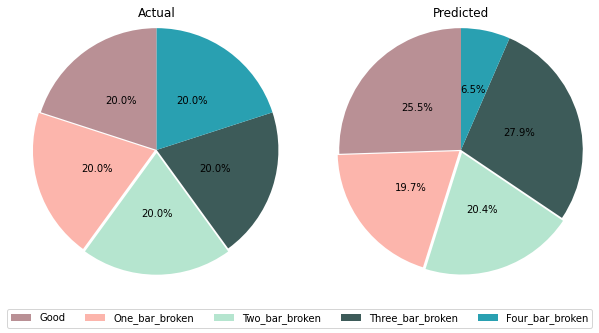

In [ ]:
# Plotting Actual and Prediction results

myexplode = [0.0, 0.02, 0.03, 0.0, 0.0]
colors = ['#B99095','#FCB5AC','#B5E5CF','#3D5B59', '#29A0B1']
labels = ['Good', 'One_bar_broken', 'Two_bar_broken', 'Three_bar_broken', 'Four_bar_broken']
fig, (ax1,ax2) = plt.subplots(1,2,figsize=(10,5))
ax1.pie(x=data1['count'], autopct="%.1f%%", pctdistance=0.5, startangle = 90, explode=myexplode, colors= colors, radius =1.2)
ax1.set_title('Actual')
ax2.pie(x=data2['count'], autopct="%.1f%%", pctdistance=0.5, startangle = 90, explode=myexplode, colors= colors, radius=1.2)
ax2.set_title('Predicted')
fig.legend(labels=labels, loc='lower center', ncol=5)
plt.show() #show all figures


In [ ]:
# Calculating Accuracy for Random Forest Classifier

evaluator = MulticlassClassificationEvaluator(labelCol="labelIndex", predictionCol="prediction")
accuracy = evaluator.evaluate(predictions)
print("Accuracy = %s" % (accuracy))
print("Test Error = %s" % (1.0 - accuracy))

Accuracy = 0.6777447046190652
Test Error = 0.3222552953809348


Decision Tree Classification Model

In [ ]:
# Model Inialization
dt = DecisionTreeClassifier(featuresCol = 'features', labelCol = 'labelIndex', maxDepth = 10)

# Training
dtModel = dt.fit(train)

# Testing 
dt_predictions = dtModel.transform(test)

display(dt_predictions)

Ia,Ib,Ic,Va,Vb,Vc,Trig,Vib_acpe,Vib_carc,Vib_acpi,Vib_axial,Vib_base,Status,features,labelIndex,rawPrediction,probability,prediction
-0.02083333,-0.004166667,-0.004166667,2.833333,2.85,2.825,6.228943,-0.1800537,-0.1403809,-0.2105713,0.006103516,0.2929688,good,"Map(vectorType -> dense, length -> 12, values -> List(-0.02083333022892475, -0.004166666883975267, -0.004166666883975267, 2.8333330154418945, 2.8499999046325684, 2.825000047683716, 6.22894287109375, -0.1800536960363388, -0.14038090407848358, -0.2105713039636612, 0.006103516090661287, 0.2929688096046448))",2.0,"Map(vectorType -> dense, length -> 5, values -> List(35.0, 7121.0, 2348.0, 1897.0, 302.0))","Map(vectorType -> dense, length -> 5, values -> List(0.002990686148850722, 0.6084764590275997, 0.20063231650004273, 0.16209518926770913, 0.02580534905579766))",1.0
-0.02083333,-0.004166667,0.004166667,-0.6833333,-0.7,-0.6916667,6.218262,0.3936768,0.1190186,-0.06408691,0.0,0.7354736,good,"Map(vectorType -> dense, length -> 12, values -> List(-0.02083333022892475, -0.004166666883975267, 0.004166666883975267, -0.6833332777023315, -0.699999988079071, -0.6916667222976685, 6.218262195587158, 0.3936767876148224, 0.11901859939098358, -0.0640869066119194, 0.0, 0.7354735732078552))",2.0,"Map(vectorType -> dense, length -> 5, values -> List(0.0, 125.0, 421.0, 576.0, 82.0))","Map(vectorType -> dense, length -> 5, values -> List(0.0, 0.10382059800664452, 0.3496677740863787, 0.47840531561461797, 0.0681063122923588))",3.0
-0.02083333,0.0,0.004166667,-0.875,-0.875,-0.8833333,0.04638672,4.504395,6.07605,4.6875,0.02441406,4.434204,good,"Map(vectorType -> dense, length -> 12, values -> List(-0.02083333022892475, 0.0, 0.004166666883975267, -0.875, -0.875, -0.8833333253860474, 0.04638671875, 4.504395008087158, 6.0760498046875, 4.6875, 0.02441406063735485, 4.4342041015625))",2.0,"Map(vectorType -> dense, length -> 5, values -> List(0.0, 5.0, 67176.0, 188.0, 7480.0))","Map(vectorType -> dense, length -> 5, values -> List(0.0, 6.680115966813184E-5, 0.8974869403732849, 0.0025117236035217573, 0.09993453486352523))",2.0
-0.02083333,0.0,0.004166667,-0.6916667,-0.6833333,-0.6916667,6.206665,0.1373291,-0.1434326,0.06713867,-0.009155273,0.4638672,good,"Map(vectorType -> dense, length -> 12, values -> List(-0.02083333022892475, 0.0, 0.004166666883975267, -0.6916667222976685, -0.6833332777023315, -0.6916667222976685, 6.2066650390625, 0.1373291015625, -0.1434326022863388, 0.067138671875, -0.0091552734375, 0.4638671875))",2.0,"Map(vectorType -> dense, length -> 5, values -> List(12804.0, 7387.0, 11032.0, 16739.0, 4459.0))","Map(vectorType -> dense, length -> 5, values -> List(0.24425325728238684, 0.14091680814940577, 0.2104500104919784, 0.3193185936933672, 0.08506133038286183))",3.0
-0.02083333,0.0,0.0125,1.358333,1.325,1.341667,0.04699707,5.557251,6.524658,6.530762,-0.06408691,4.653931,good,"Map(vectorType -> dense, length -> 12, values -> List(-0.02083333022892475, 0.0, 0.012500000186264515, 1.3583329916000366, 1.3250000476837158, 1.3416670560836792, 0.0469970703125, 5.5572509765625, 6.524658203125, 6.530762195587158, -0.0640869066119194, 4.653931140899658))",2.0,"Map(vectorType -> dense, length -> 5, values -> List(22.0, 22.0, 12662.0, 7.0, 1001.0))","Map(vectorType -> dense, length -> 5, values -> List(0.001604200087501823, 0.001604200087501823, 0.9232900685430947, 5.104273005687619E-4, 0.07299110398133295))",2.0
-0.02083333,0.008333333,0.01666667,-2.775,-2.766667,-2.758333,0.0479126,4.760742,5.871582,2.456665,0.06103516,3.396606,good,"Map(vectorType -> dense, length -> 12, values -> List(-0.02083333022892475, 0.00833333283662796, 0.01666666939854622, -2.7750000953674316, -2.766666889190674, -2.7583329677581787, 0.0479126013815403, 4.7607421875, 5.87158203125, 2.4566650390625, 0.0610351599752903, 3.396605968475342))",2.0,"Map(vectorType -> dense, length -> 5, values -> List(0.0, 0.0, 22807.0, 4466.0, 14252.0))","Map(vectorType -> dense, length -> 5, values -> List(0.0, 0.0, 0.5492354003612282, 0.10754966

In [ ]:
# Calculating Accuracy for Decision Tree Classification Model

evaluator = MulticlassClassificationEvaluator(labelCol="labelIndex", predictionCol="prediction")
accuracy = evaluator.evaluate(dt_predictions)
print("Accuracy = %s" % (accuracy))
print("Test Error = %s" % (1.0 - accuracy))


Accuracy = 0.8101222086105494
Test Error = 0.1898777913894506


In [ ]:
df_predict1 = dt_predictions.select('labelIndex','prediction')
pdf1 = df_predict1.toPandas()
display(pdf1)


labelIndex,prediction
2.0,1.0
2.0,3.0
2.0,2.0
2.0,3.0
2.0,2.0
2.0,2.0
2.0,4.0
2.0,2.0
2.0,2.0
2.0,2.0


In [ ]:
#Preparing Data for plotting values

data1 = dt_predictions.groupby("labelIndex").count()
data1 = data1.toPandas()
data1 = data1.sort_values(by='labelIndex')
data2 = dt_predictions.groupby("prediction").count()
data2 = data2.toPandas()
data2 = data2.sort_values(by='prediction')

Graph of Actual Vs Predicted values derived from Decision Tree Classifier

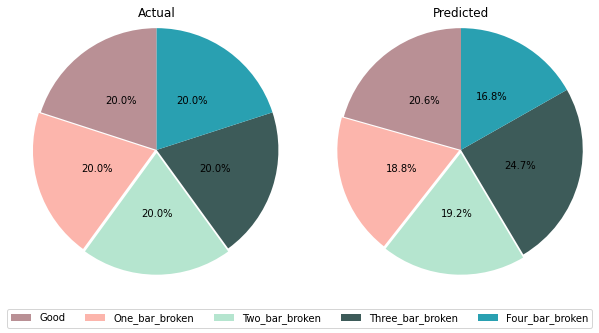

In [ ]:
# Plotting Actual and Prediction results

myexplode = [0.0, 0.02, 0.03, 0.0, 0.0]
colors = ['#B99095','#FCB5AC','#B5E5CF','#3D5B59', '#29A0B1']
labels = ['Good', 'One_bar_broken', 'Two_bar_broken', 'Three_bar_broken', 'Four_bar_broken']
fig, (ax1,ax2) = plt.subplots(1,2,figsize=(10,5))
ax1.pie(x=data1['count'], autopct="%.1f%%", pctdistance=0.5, startangle = 90, explode=myexplode, colors= colors, radius =1.2)
ax1.set_title('Actual')
ax2.pie(x=data2['count'], autopct="%.1f%%", pctdistance=0.5, startangle = 90, explode=myexplode, colors= colors, radius=1.2)
ax2.set_title('Predicted')
fig.legend(labels=labels, loc='lower center', ncol=5)
plt.show() #show all figures

Cross validation to improve Random Forest Results

In [ ]:
# Creating a multiclass evaluator
evaluator1 = MulticlassClassificationEvaluator(labelCol="labelIndex", predictionCol="prediction")

#building a parameter grid wwith 2 grids
paramGrid = (ParamGridBuilder()
            .addGrid(rf.maxDepth, [2, 4, 6])
            .addGrid(rf.numTrees, [10, 100])
            .build())

#Intinalizing cross validator
cv = CrossValidator(estimator=rf, 
                    evaluator=evaluator1, 
                    estimatorParamMaps=paramGrid, 
                    numFolds=3, 
                    parallelism=25, 
                    seed=42)

# Creating Pipeline with stages
pipeline1 = Pipeline(stages=[cv])
pipelineModel = pipeline1.fit(train)
predDF = pipelineModel.transform(test)

Deprecation warning: The PySpark MLlib + MLflow Tracking integration is deprecated. Soon, we will remove this feature and replace it with MLflow PySpark ML autologging and Databricks Autologging.
 To try the new MLflow PySpark ML autologging feature, which will be enabled by default in an upcoming release, call `mlflow.pyspark.ml.autolog()`.
MLlib will automatically track trials in MLflow. After your tuning fit() call has completed, view the MLflow UI to see logged runs.


In [ ]:
# Evaluating Accuracy

evaluator = MulticlassClassificationEvaluator(labelCol="labelIndex", predictionCol="prediction")
accuracy = evaluator.evaluate(predDF)
print("Accuracy = %s" % (accuracy))
print("Test Error = %s" % (1.0 - accuracy))

Accuracy = 0.7187906554833841
Test Error = 0.28120934451661594


In [ ]:
cv_predictions = predDF.select('labelIndex','prediction')
cv_pdf = cv_predictions.toPandas()
display(cv_pdf)

labelIndex,prediction
2.0,1.0
2.0,3.0
2.0,2.0
2.0,3.0
2.0,2.0
2.0,2.0
2.0,0.0
2.0,2.0
2.0,2.0
2.0,3.0


In [ ]:
#Preparing Data for plotting values

data1 = predDF.groupby("labelIndex").count()
data1 = data1.toPandas()
data1 = data1.sort_values(by='labelIndex')
data2 = predDF.groupby("prediction").count()
data2 = data2.toPandas()
data2 = data2.sort_values(by='prediction')

Graph of Actual Vs Predicted values derived from Cross Validation

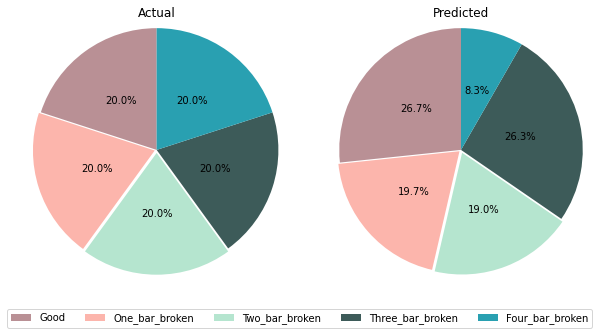

In [ ]:
# Plotting Actual and Prediction results

myexplode = [0.0, 0.02, 0.03, 0.0, 0.0]
colors = ['#B99095','#FCB5AC','#B5E5CF','#3D5B59', '#29A0B1']
labels = ['Good', 'One_bar_broken', 'Two_bar_broken', 'Three_bar_broken', 'Four_bar_broken']
fig, (ax1,ax2) = plt.subplots(1,2,figsize=(10,5))
ax1.pie(x=data1['count'], autopct="%.1f%%", pctdistance=0.5, startangle = 90, explode=myexplode, colors= colors, radius =1.2)
ax1.set_title('Actual')
ax2.pie(x=data2['count'], autopct="%.1f%%", pctdistance=0.5, startangle = 90, explode=myexplode, colors= colors, radius=1.2)
ax2.set_title('Predicted')
fig.legend(labels=labels, loc='lower center', ncol=5)
plt.show() #show all figures

After hyperparameter tuning the random forest model accuracy improved from 69% to 71%

Neural Network Model

In [ ]:
# layers for the neural network:
# input layer of size 12 (features), Three intermediate of size 15 each, output layer of size 5 (classes)
layers = [12, 15, 15, 15, 5]

# creating the trainer and setting its parameters
trainer = MultilayerPerceptronClassifier(maxIter=250, layers=layers, blockSize=128, seed=42, featuresCol = 'features', labelCol = 'labelIndex')

# training the model
model = trainer.fit(train)

result = model.transform(test)

predictionAndLabels = result.select("prediction", "labelIndex")

evaluator = MulticlassClassificationEvaluator(labelCol="labelIndex", predictionCol="prediction")


In [ ]:
# computing accuracy on the test set

accuracy = evaluator.evaluate(predictionAndLabels)

print("Accuracy = %s" % (accuracy))

print("Test Error = %s" % (1.0 - accuracy))

Accuracy = 0.7704756395087279
Test Error = 0.22952436049127212


In [ ]:
#Preparing Data for plotting values

data1 = predictionAndLabels.groupby("labelIndex").count()
data1 = data1.toPandas()
data1 = data1.sort_values(by='labelIndex')
data2 = predictionAndLabels.groupby("prediction").count()
data2 = data2.toPandas()
data2 = data2.sort_values(by='prediction')

Graph of Actual Vs Predicted values derived from Neural Network Multilayer Perceptron Classifier

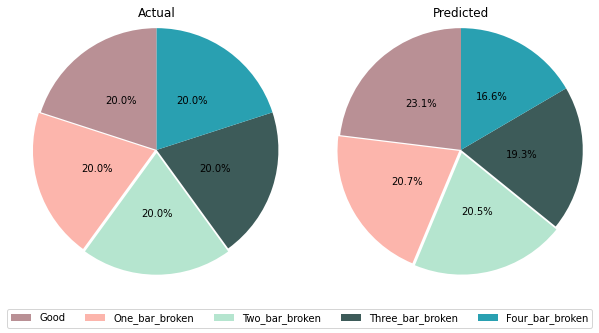

In [ ]:
# Plotting Actual and Prediction results

myexplode = [0.0, 0.02, 0.03, 0.0, 0.0]
colors = ['#B99095','#FCB5AC','#B5E5CF','#3D5B59', '#29A0B1']
labels = ['Good', 'One_bar_broken', 'Two_bar_broken', 'Three_bar_broken', 'Four_bar_broken']
fig, (ax1,ax2) = plt.subplots(1,2,figsize=(10,5))
ax1.pie(x=data1['count'], autopct="%.1f%%", pctdistance=0.5, startangle = 90, explode=myexplode, colors= colors, radius =1.2)
ax1.set_title('Actual')
ax2.pie(x=data2['count'], autopct="%.1f%%", pctdistance=0.5, startangle = 90, explode=myexplode, colors= colors, radius=1.2)
ax2.set_title('Predicted')
fig.legend(labels=labels, loc='lower center', ncol=5)
plt.show() #show all figures

5.0 Autoassociative neural network

In [ ]:
# layers for the neural network:
# input layer of size 12 (features), three intermediate of size 15, 10, 15 respectively, output layer of size 5 (classes)
layers_1 = [12, 15, 10, 15, 5]

# creating the trainer and setting its parameters
trainer_1 = MultilayerPerceptronClassifier(maxIter=250, layers=layers_1, blockSize=128, seed=42, featuresCol = 'features', labelCol = 'labelIndex')

# training the model
model_1 = trainer_1.fit(train)

result_1 = model_1.transform(test)

predictionAndLabels_1 = result_1.select("prediction", "labelIndex")

evaluator_1 = MulticlassClassificationEvaluator(labelCol="labelIndex", predictionCol="prediction")


In [ ]:
# Computing accuracy on the test set

accuracy_1 = evaluator_1.evaluate(predictionAndLabels_1)

print("Accuracy = %s" % (accuracy_1))

print("Test Error = %s" % (1.0 - accuracy_1))

Accuracy = 0.7677768469395889
Test Error = 0.23222315306041108


In [ ]:
#Preparing Data for plotting values

data1 = predictionAndLabels_1.groupby("labelIndex").count()
data1 = data1.toPandas()
data1 = data1.sort_values(by='labelIndex')
data2 = predictionAndLabels_1.groupby("prediction").count()
data2 = data2.toPandas()
data2 = data2.sort_values(by='prediction')

Graph of Actual Vs Predicted values derived from Auto Associative Neural Network (Multilayer Perceptron Classifier)

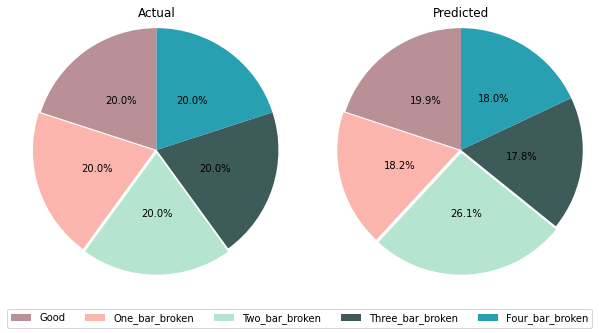

In [ ]:
# Plotting Actual and Prediction results

myexplode = [0.0, 0.02, 0.03, 0.0, 0.0]
colors = ['#B99095','#FCB5AC','#B5E5CF','#3D5B59', '#29A0B1']
labels = ['Good', 'One_bar_broken', 'Two_bar_broken', 'Three_bar_broken', 'Four_bar_broken']
fig, (ax1,ax2) = plt.subplots(1,2,figsize=(10,5))
ax1.pie(x=data1['count'], autopct="%.1f%%", pctdistance=0.5, startangle = 90, explode=myexplode, colors= colors, radius =1.2)
ax1.set_title('Actual')
ax2.pie(x=data2['count'], autopct="%.1f%%", pctdistance=0.5, startangle = 90, explode=myexplode, colors= colors, radius=1.2)
ax2.set_title('Predicted')
fig.legend(labels=labels, loc='lower center', ncol=5)
plt.show() #show all figures

Different Models Comparision

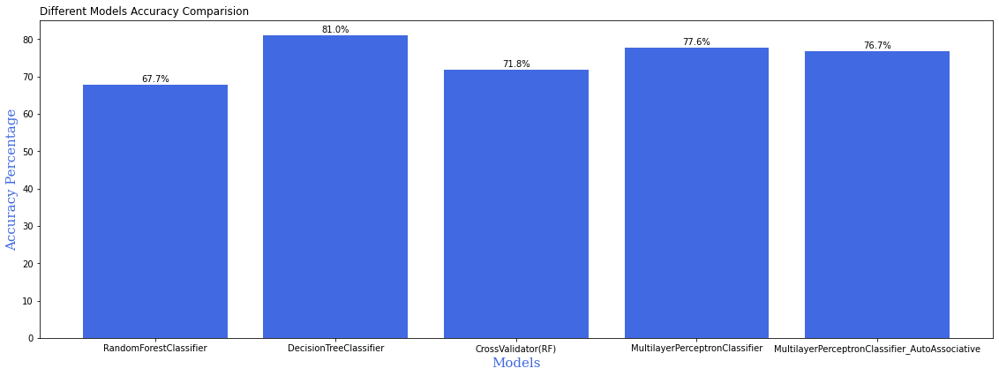

In [ ]:
Models = ['RandomForestClassifier', 'DecisionTreeClassifier', 'CrossValidator(RF)', 'MultilayerPerceptronClassifier', 'MultilayerPerceptronClassifier_AutoAssociative']
Accuracy = [67.7, 81.0, 71.8, 77.6, 76.7]
fig = plt.figure(figsize=(15,5))
ax = fig.add_axes([0,0,1,1])
bar_graph = ax.bar(Models, Accuracy, color='royalblue')
for p in bar_graph:
  height = p.get_height()
  ax.text(x=p.get_x() + p.get_width() / 2, y=height+.80,
      s="{}%".format(height),
      ha='center')

font1 = {'family':'serif','color':'royalblue','size':15}
font2 = {'family':'serif','color':'royalblue','size':15}

plt.xlabel("Models", fontdict = font1)
plt.ylabel("Accuracy Percentage", fontdict = font1)
plt.title("Different Models Accuracy Comparision", loc = 'left')
plt.show()